<a href="https://colab.research.google.com/github/BoWarburton/DS-Unit-2-Linear-Models/blob/master/module1-regression-1/211_LS_DS_211_assignment_BoWarburton.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Lambda School Data Science

*Unit 2, Sprint 1, Module 1*

---

# Regression 1

## Assignment

You'll use another **New York City** real estate dataset. 

But now you'll **predict how much it costs to rent an apartment**, instead of how much it costs to buy a condo.

The data comes from renthop.com, an apartment listing website.

- [X] Look at the data. Choose a feature, and plot its relationship with the target.
- [X] Use scikit-learn for linear regression with one feature. You can follow the [5-step process from Jake VanderPlas](https://jakevdp.github.io/PythonDataScienceHandbook/05.02-introducing-scikit-learn.html#Basics-of-the-API).
- [X] Define a function to make new predictions and explain the model coefficient.
- [X] Organize and comment your code.

> [Do Not Copy-Paste.](https://docs.google.com/document/d/1ubOw9B3Hfip27hF2ZFnW3a3z9xAgrUDRReOEo-FHCVs/edit) You must type each of these exercises in, manually. If you copy and paste, you might as well not even do them. The point of these exercises is to train your hands, your brain, and your mind in how to read, write, and see code. If you copy-paste, you are cheating yourself out of the effectiveness of the lessons.

If your **Plotly** visualizations aren't working:
- You must have JavaScript enabled in your browser
- You probably want to use Chrome or Firefox
- You may need to turn off ad blockers
- [If you're using Jupyter Lab locally, you need to install some "extensions"](https://plot.ly/python/getting-started/#jupyterlab-support-python-35)

## Stretch Goals
- [X] Do linear regression with two or more features.
- [X] Read [The Discovery of Statistical Regression](https://priceonomics.com/the-discovery-of-statistical-regression/)
- [X] Read [_An Introduction to Statistical Learning_](http://faculty.marshall.usc.edu/gareth-james/ISL/ISLR%20Seventh%20Printing.pdf), Chapter 2.1: What Is Statistical Learning?

In [0]:
import sys

# If you're on Colab:
if 'google.colab' in sys.modules:
    DATA_PATH = 'https://raw.githubusercontent.com/LambdaSchool/DS-Unit-2-Applied-Modeling/master/data/'

# If you're working locally:
else:
    DATA_PATH = '../data/'
    
# Ignore this Numpy warning when using Plotly Express:
# FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
import warnings
warnings.filterwarnings(action='ignore', category=FutureWarning, module='numpy')

In [0]:
# Read New York City apartment rental listing data
import pandas as pd
df = pd.read_csv(DATA_PATH+'apartments/renthop-nyc.csv')
assert df.shape == (49352, 34)

In [0]:
# Remove outliers: 
# the most extreme 1% prices,
# the most extreme .1% latitudes, &
# the most extreme .1% longitudes
df = df[(df['price'] >= 1375) & (df['price'] <= 15500) & 
        (df['latitude'] >=40.57) & (df['latitude'] < 40.99) &
        (df['longitude'] >= -74.1) & (df['longitude'] <= -73.38)]

## Look at the data, choose a feature, plot

In [0]:
# There are categoricals, such as "elevator" through "common_outdoor_space"
# Which are yes-no coded as 0-1 numbers
df.head()

,bathrooms,bedrooms,created,description,display_address,latitude,longitude,price,street_address,interest_level,elevator,cats_allowed,hardwood_floors,dogs_allowed,doorman,dishwasher,no_fee,laundry_in_building,fitness_center,pre-war,laundry_in_unit,roof_deck,outdoor_space,dining_room,high_speed_internet,balcony,swimming_pool,new_construction,terrace,exclusive,loft,garden_patio,wheelchair_access,common_outdoor_space
0,1.5,3,2016-06-24 07:54:24,A Brand New 3 Bedroom 1.5 bath ApartmentEnjoy ...,Metropolitan Avenue,40.7145,-73.9425,3000,792 Metropolitan Avenue,medium,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1.0,2,2016-06-12 12:19:27,,Columbus Avenue,40.7947,-73.9667,5465,808 Columbus Avenue,low,1,1,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1.0,1,2016-04-17 03:26:41,"Top Top West Village location, beautiful Pre-w...",W 13 Street,40.7388,-74.0018,2850,241 W 13 Street,high,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,1.0,1,2016-04-18 02:22:02,Building Amenities - Garage - Garden - fitness...,East 49th Street,40.7539,-73.9677,3275,333 East 49th Street,low,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,1.0,4,2016-04-28 01:32:41,Beautifully renovated 3 bedroom flex 4 bedroom...,West 143rd Street,40.8241,-73.9493,3350,500 West 143rd Street,low,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [0]:
import pandas_profiling
pandas_profiling.ProfileReport(df)

/usr/local/lib/python3.6/dist-packages/pandas_profiling/describe.py:392: FutureWarning: The join_axes-keyword is deprecated. Use .reindex or .reindex_like on the result to achieve the same functionality.
  variable_stats = pd.concat(ldesc, join_axes=pd.Index([names]), axis=1)


Number of variables,35
Number of observations,48818
Total Missing (%),0.1%
Total size in memory,13.0 MiB
Average record size in memory,280.0 B
Numeric,6
Categorical,5
Boolean,23
Date,0
Text (Unique),0
Rejected,1


In [0]:
df.dtypes

bathrooms               float64
bedrooms                  int64
created                  object
description              object
display_address          object
latitude                float64
longitude               float64
price                     int64
street_address           object
interest_level           object
elevator                  int64
cats_allowed              int64
hardwood_floors           int64
dogs_allowed              int64
doorman                   int64
dishwasher                int64
no_fee                    int64
laundry_in_building       int64
fitness_center            int64
pre-war                   int64
laundry_in_unit           int64
roof_deck                 int64
outdoor_space             int64
dining_room               int64
high_speed_internet       int64
balcony                   int64
swimming_pool             int64
new_construction          int64
terrace                   int64
exclusive                 int64
loft                      int64
garden_p

In [0]:
# Again, categoricals showing up as numeric
import numpy as np
df.describe(include=[np.number])

,bathrooms,bedrooms,latitude,longitude,price,elevator,cats_allowed,hardwood_floors,dogs_allowed,doorman,dishwasher,no_fee,laundry_in_building,fitness_center,pre-war,laundry_in_unit,roof_deck,outdoor_space,dining_room,high_speed_internet,balcony,swimming_pool,new_construction,terrace,exclusive,loft,garden_patio,wheelchair_access,common_outdoor_space
count,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.00000,48818.000000,48818.000000
mean,1.201790,1.537158,40.750756,-73.972758,3579.560982,0.524827,0.478266,0.478266,0.447622,0.424843,0.415072,0.367078,0.052767,0.268446,0.185649,0.175898,0.132758,0.138392,0.102831,0.087201,0.060469,0.055205,0.051907,0.046192,0.043304,0.042710,0.03933,0.027224,0.026240
std,0.470707,1.106078,0.038962,0.028887,1762.420875,0.499388,0.499533,0.499533,0.497254,0.494324,0.492740,0.482013,0.223571,0.443156,0.388827,0.380737,0.339317,0.345314,0.303741,0.282133,0.238357,0.228382,0.221842,0.209903,0.203542,0.202204,0.19438,0.162736,0.159851
min,0.000000,0.000000,40.571200,-74.087300,1375.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
25%,1.000000,1.000000,40.728300,-73.991800,2500.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
50%,1.000000,1.000000,40.751700,-73.978000,3150.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
75%,1.000000,2.000000,40.774000,-73.955000,4095.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
max,10.000000,8.000000,40.989400,-73.700100,15500.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000


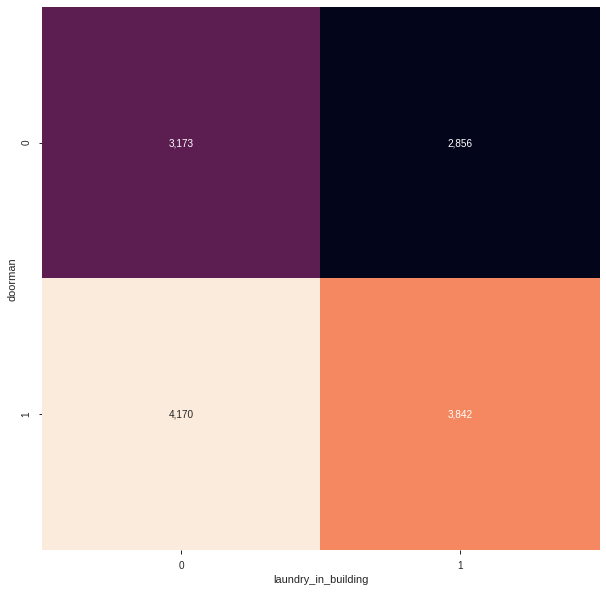

In [0]:
# doorman, dishwasher, and laundry looked like possibilities
import matplotlib.pyplot as plt
heat_table = df.pivot_table('price', 'doorman', 'laundry_in_building')
plt.figure(figsize=(10,10))
sns.heatmap(heat_table, annot=True, fmt=',.0f', cbar=False);

# It looks like having a doorman OR laundry increases price, but the best is doorman but not laundry!

In [0]:
# I have a hunch that lat-long would be useful, but based on value_counts,
# It seems that they would need to be grouped into something more useful like ZIP code
df['longitude'].value_counts()

-73.9982    292
-73.9875    268
-73.9864    266
-73.9838    247
-74.0149    244
           ... 
-74.0187      1
-73.8723      1
-73.8730      1
-73.9071      1
-74.0344      1
Name: longitude, Length: 1605, dtype: int64

In [0]:
# I thought display_address would be a good grouping by neighborhood,
# but it doesn't look promising.
df.display_address.value_counts()

Broadway               435
East 34th Street       355
Second Avenue          349
Wall Street            330
West 37th Street       287
                      ... 
Suydam St, Bushwick      1
333 E 46 St.             1
W 55th                   1
W 22 St.                 1
65th Ave                 1
Name: display_address, Length: 8675, dtype: int64

In [0]:
import numpy as np
df.describe(include=[np.number])

,bathrooms,bedrooms,latitude,longitude,price,elevator,cats_allowed,hardwood_floors,dogs_allowed,doorman,dishwasher,no_fee,laundry_in_building,fitness_center,pre-war,laundry_in_unit,roof_deck,outdoor_space,dining_room,high_speed_internet,balcony,swimming_pool,new_construction,terrace,exclusive,loft,garden_patio,wheelchair_access,common_outdoor_space
count,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.00000,48818.000000,48818.000000
mean,1.201790,1.537158,40.750756,-73.972758,3579.560982,0.524827,0.478266,0.478266,0.447622,0.424843,0.415072,0.367078,0.052767,0.268446,0.185649,0.175898,0.132758,0.138392,0.102831,0.087201,0.060469,0.055205,0.051907,0.046192,0.043304,0.042710,0.03933,0.027224,0.026240
std,0.470707,1.106078,0.038962,0.028887,1762.420875,0.499388,0.499533,0.499533,0.497254,0.494324,0.492740,0.482013,0.223571,0.443156,0.388827,0.380737,0.339317,0.345314,0.303741,0.282133,0.238357,0.228382,0.221842,0.209903,0.203542,0.202204,0.19438,0.162736,0.159851
min,0.000000,0.000000,40.571200,-74.087300,1375.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
25%,1.000000,1.000000,40.728300,-73.991800,2500.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
50%,1.000000,1.000000,40.751700,-73.978000,3150.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
75%,1.000000,2.000000,40.774000,-73.955000,4095.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
max,10.000000,8.000000,40.989400,-73.700100,15500.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000


In [0]:
df.corr()

,bathrooms,bedrooms,latitude,longitude,price,elevator,cats_allowed,hardwood_floors,dogs_allowed,doorman,dishwasher,no_fee,laundry_in_building,fitness_center,pre-war,laundry_in_unit,roof_deck,outdoor_space,dining_room,high_speed_internet,balcony,swimming_pool,new_construction,terrace,exclusive,loft,garden_patio,wheelchair_access,common_outdoor_space
bathrooms,1.000000,0.524077,0.013445,-0.020129,0.687297,0.132889,0.021484,0.096929,0.024547,0.157179,0.172235,0.129553,-0.013200,0.148338,-0.016209,0.209369,0.102116,0.144453,0.233041,0.089076,0.136991,0.113317,0.066828,0.140769,-0.001942,0.014262,0.096285,0.066941,-0.003401
bedrooms,0.524077,1.000000,0.003450,0.055141,0.535494,-0.024830,-0.011181,0.096410,-0.009758,-0.047569,0.152094,0.162993,0.008555,0.013145,0.001416,0.151786,0.045448,0.124908,0.189411,0.061003,0.097769,0.033439,0.000905,0.099147,-0.014882,-0.107343,0.070759,0.012304,0.003232
latitude,0.013445,0.003450,1.000000,0.328711,-0.036214,-0.010421,-0.029710,0.018739,-0.030862,-0.043302,-0.020528,-0.026710,-0.041604,-0.108374,0.026841,-0.044285,-0.063147,-0.079864,0.017174,-0.030933,0.016897,0.027036,-0.056059,0.006486,-0.060021,-0.015626,-0.000569,-0.068300,-0.117158
longitude,-0.020129,0.055141,0.328711,1.000000,-0.251018,-0.189887,-0.058539,-0.108550,-0.070387,-0.275758,-0.169259,-0.088078,-0.044574,-0.254968,0.000159,-0.130155,-0.161472,-0.098611,-0.024815,-0.125641,-0.035488,-0.075054,-0.108004,-0.049025,0.046732,-0.060026,-0.029858,-0.063638,-0.102952
price,0.687297,0.535494,-0.036214,-0.251018,1.000000,0.207180,0.051465,0.101515,0.060412,0.276224,0.223908,0.132249,-0.019414,0.228782,-0.029115,0.271200,0.122933,0.142151,0.242915,0.090273,0.139142,0.134516,0.071433,0.145975,-0.013248,0.007103,0.103675,0.072519,0.011519
elevator,0.132889,-0.024830,-0.010421,-0.189887,0.207180,1.000000,0.033367,0.270846,0.034851,0.614565,0.349844,0.227908,0.141100,0.431076,-0.097004,0.134166,0.332032,0.204349,0.200596,0.277669,0.168085,0.183667,0.184181,0.135332,0.025900,0.054922,0.084059,0.155397,0.114884
cats_allowed,0.021484,-0.011181,-0.029710,-0.058539,0.051465,0.033367,1.000000,-0.177611,0.937246,0.088495,-0.047863,-0.024037,0.105648,0.126896,0.047509,-0.008818,0.027598,0.066720,-0.022397,0.077765,0.019984,0.009709,0.042714,0.006156,0.031418,-0.037962,0.006694,0.039659,0.104498
hardwood_floors,0.096929,0.096410,0.018739,-0.108550,0.101515,0.270846,-0.177611,1.000000,-0.185642,0.205133,0.634989,0.342981,-0.144722,0.167519,0.013444,0.360721,0.278732,0.188919,0.317284,0.237939,0.178092,0.170592,0.187637,0.181008,-0.194430,0.116575,0.161754,0.124831,-0.120485
dogs_allowed,0.024547,-0.009758,-0.030862,-0.070387,0.060412,0.034851,0.937246,-0.185642,1.000000,0.095448,-0.043822,-0.011400,0.093039,0.131530,0.051618,0.002518,0.034111,0.067865,-0.016148,0.089430,0.024476,0.009679,0.055659,0.005223,0.032733,-0.041010,0.009233,0.048125,0.106074
doorman,0.157179,-0.047569,-0.043302,-0.275758,0.276224,0.614565,0.088495,0.205133,0.095448,1.000000,0.312720,0.257041,0.077219,0.604867,-0.054605,0.166403,0.388924,0.205661,0.195818,0.312038,0.160793,0.263835,0.219946,0.126939,-0.074743,0.010083,0.075959,0.168163,0.126710


In [0]:
# Looking at lat, long, price
import plotly.express as px
px.scatter(df, x='longitude', y='price', opacity=0.2, trendline='ols')

In [0]:
px.scatter(df, x='latitude', y='price', opacity=0.2, trendline='ols')

In [0]:
px.scatter(df, x='longitude', y='latitude', opacity=0.2)

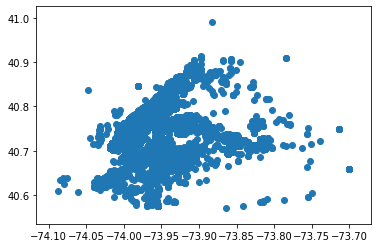

In [0]:
# Try visualization with matplotlib
import matplotlib.pyplot as plt
x = df['longitude']
y = df['latitude']
heat = df['price']
plt.scatter(x=x, y=y)
plt.show()

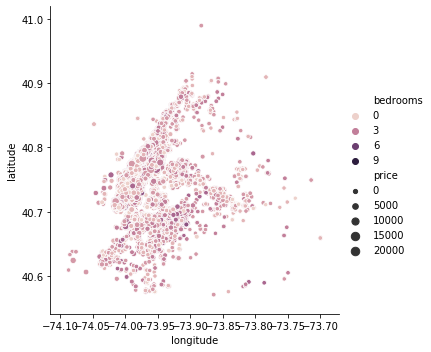

In [0]:
# Try visualization with seaborn
import seaborn as sns
sns.relplot(x='longitude',
            y='latitude',
            size='price',
            hue='bedrooms',
            data=df)

In [0]:
# Look specifically at price
pd.options.display.float_format = '{:,.0f}'.format
df['price'].describe()

count   48,818
mean     3,580
std      1,762
min      1,375
25%      2,500
50%      3,150
75%      4,095
max     15,500
Name: price, dtype: float64

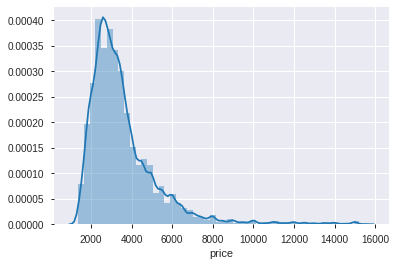

In [0]:
%matplotlib inline
import seaborn as sns
sns.distplot(df['price']);

In [0]:
# Try bathrooms
px.scatter(df, x='bathrooms', y='price', opacity=0.5, trendline='ols')

In [0]:
# So many places have 1 bathroom and only one has 10
# This will limit the usefulness of the feature as a predictor, I think
df['bathrooms'].value_counts()

1.0     39153
2.0      7619
3.0       680
1.5       645
0.0       304
2.5       256
4.0        93
3.5        55
4.5         8
5.0         4
10.0        1
Name: bathrooms, dtype: int64

In [0]:
# Actual rents for 3.5 bathroom units range from $7,500 to $10,500
df[df.bathrooms == bath].price.head()

25       7500
85      13500
1586    13500
2298    13500
4374    10500
Name: price, dtype: int64

In [0]:
# Maybe bedrooms?
# Let's go with bedrooms for the first try
px.scatter(df, x='bedrooms', y='price', opacity=0.5, trendline='ols')

In [0]:
df['bedrooms'].value_counts()

1    15651
2    14570
0     9317
3     7188
4     1825
5      221
6       43
8        2
7        1
Name: bedrooms, dtype: int64

## Linear regression with one feature

In [0]:
# To reiterate, start with baselines
print(f'Mean price is {df.price.mean():,.0f}')
print(f'Median price is {df.price.median():,.0f}')
address = 'Second Avenue'
price_baseline = df[df.display_address == address].price.mean()
print(f'Mean price for {address} is {price_baseline:,.0f}')

Mean price is 3,580
Median price is 3,150
Mean price for Second Avenue is 3,352


In [0]:
# Five-step process is
# 1 Import estimator class
# 2 Instantiate the class
# 3 X features, y target
# 4 Fit (train) model
# 5 Use model on new data

In [0]:
from sklearn.linear_model import LinearRegression

In [0]:
model = LinearRegression()

In [0]:
features = ['bedrooms']
target = 'price'
X_train = df[features]
y_train = df[target]

In [0]:
model.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [0]:
test_feature = [[4]]
y_pred = model.predict(test_feature)
print(f'Predicted price for {test_feature[0]} bedrooms is ${y_pred[0]:,.0f}')

Predicted price for [4] bedrooms is $5,681


*italicized text*## Define function, make new predictions, explain coefficient

In [0]:
# Function to make new predictions and explain model coefficient
def predict(bedrooms):
  y_pred = model.predict([[bedrooms]])
  estimate = y_pred[0]
  coefficient = model.coef_[0]
  result = f'Estimated rent is ${estimate:,.0f} for {bedrooms} bedrooms.'
  explanation = f'Each additional bedroom adds ${coefficient:,.0f}.'
  return result + '\n' + explanation

In [0]:
test = 4
print(predict(test))
print(predict(test+1))
print(predict(test+1.5))

Estimated rent is $5,681 for 4 bedrooms.
Each additional bedroom adds $853.
Estimated rent is $6,534 for 5 bedrooms.
Each additional bedroom adds $853.
Estimated rent is $6,961 for 5.5 bedrooms.
Each additional bedroom adds $853.


In [0]:
# Baseline: what is the mean rent price for 3.5 bathroom?
baseline = df[df.bathrooms == bath].price.mean()
print(f'Baseline mean for {bath} bathrooms is {baseline:,.0f}')

Baseline mean for 3.5 bathrooms is 11,808


## Organize and comment
Put it all into one kind of package

In [0]:
from ipywidgets import interact
import pandas as pd

# 1. Import
from sklearn.linear_model import LinearRegression

# Copy the instructor's code for reading NYC apartment rental listing data
df = pd.read_csv(DATA_PATH+'apartments/renthop-nyc.csv')
assert df.shape == (49352, 34)

# Remove the most extreme 1% prices, .1% latitudes, & .1% longitudes
df = df[(df['price'] >= 1375) & (df['price'] <= 15500) & 
        (df['latitude'] >=40.57) & (df['latitude'] < 40.99) &
        (df['longitude'] >= -74.1) & (df['longitude'] <= -73.38)]

# 2. Instantiate
model = LinearRegression()

# 3. Arrange
features = ['bedrooms']
target = 'price'
X = df[features]
y = df[target]

# Fit
model.fit(X, y)

# Predict
def predict(bedrooms):
  y_pred = model.predict([[bedrooms]])
  estimate = y_pred[0]
  coefficient = model.coef_[0]
  result = f'Estimated rent is ${estimate:,.0f} for {bedrooms} bedrooms.'
  explanation = f'Each additional bedroom adds ${coefficient:,.0f}.'
  return result + explanation

interact(predict, bedrooms=(0,7,.5));

interactive(children=(FloatSlider(value=3.0, description='bedrooms', max=7.0, step=0.5), Output()), _dom_class…

In [0]:
# I think I know what this is, but let me check...
help('assert')

## Stretch goal: linear regression with two variables

In [0]:
# 3D graph...might as well try with z being the response variable
px.scatter_3d(df, x='bathrooms', y='bedrooms', z='price', opacity=0.08)

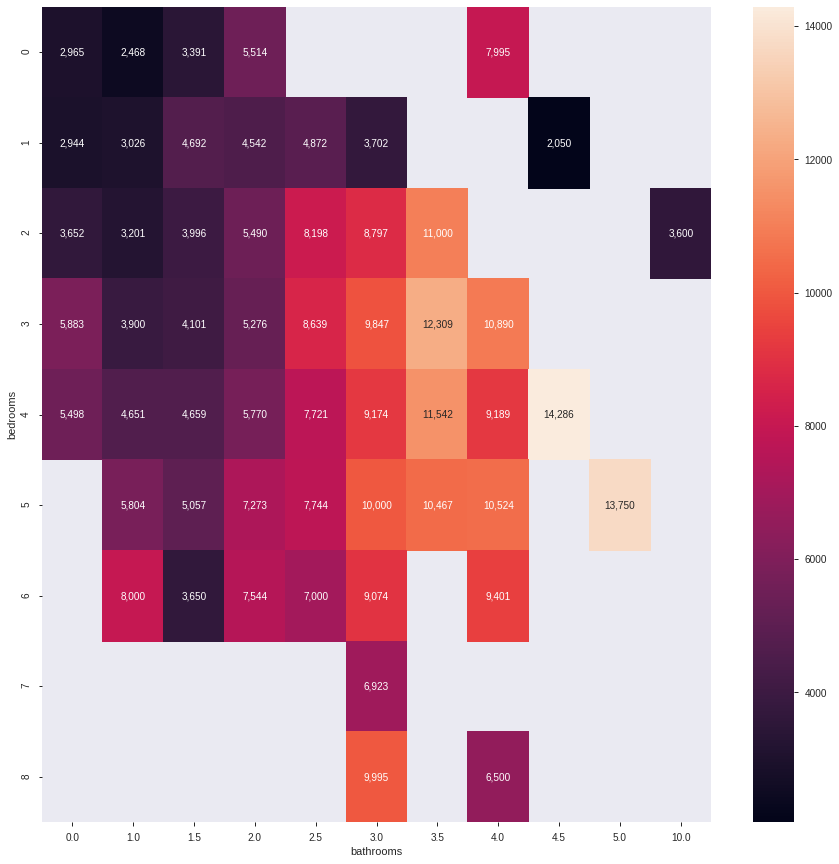

In [0]:
# Heatmap again
heat_table = df.pivot_table('price', 'bedrooms', 'bathrooms')
plt.figure(figsize=(15,15))
sns.heatmap(heat_table, fmt=',.0f', annot=True);

# Yes, it looks like these work together for good (price-wise)

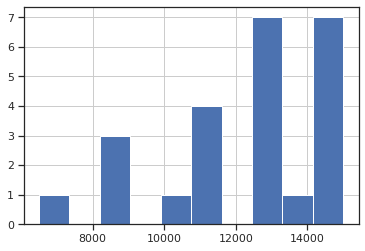

In [0]:
# df[[df.bathrooms == bath] && [df.bedrooms == bed]]
df[(df['bathrooms'] == bath) & (df['bedrooms'] == bed)].price.hist();
# df[(df['gold']>0) & (df['silver']>0)]

In [0]:
# Linear regression with two variables
# Already 1-import and 2-instantiate
# 3 Arrange
features = ['bedrooms', 'bathrooms']
train = 'price'
X = df[features]
y = df[train]
X.head()

,bedrooms,bathrooms
0,3,2
1,2,1
2,1,1
3,1,1
4,4,1


In [0]:
# 4 Fit
model.fit(X, y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [0]:
# 5 Predict
def predict_two(bedrooms, bathrooms):
  y_pred = model.predict([[bedrooms, bathrooms]])
  estimate = y_pred[0]
  bedrooms_coef = model.coef_[0]
  bathrooms_coef = model.coef_[1]
  result = f'Estimated rent for {bedrooms}-bedroom, {bathrooms}-bathroom is ${estimate:,.0f}.'
  explanation = f' Each bedroom +${bedrooms_coef:,.0f}, each bathroom +${bathrooms_coef:,.0f}.'
  return result + explanation

interact(predict_two, bedrooms=(0,5), bathrooms=(1,4.5,0.5));

interactive(children=(IntSlider(value=2, description='bedrooms', max=5), FloatSlider(value=2.5, description='b…

## Stretch goal: read _The Discovery of Statistical Regression_
### Thoughts

I was thinking about why statistical regression seemed trivial to Gauss, and yet didn't occur to Euclid, Newton, Al-Khwarizmi, Euler, Bernoulli, and Bayes? (Especially Euler. I love that guy.)

The answer, I think, lies in the example given in this article: predicting a person's weight based on height and gender. Before the 19th century, or before Newton anyway, people were not thought of as numbers. Mathematics was a branch of geometry, a pursuit of truth, not guesses, and not a study for people. It is telling that Gauss and Legendre were both attempting to get a true value from a set of measurements known to contain errors. They were essentially saying that the average is the truth, which is a horrible error when applied to people. See Todd Rose, _The End of Average_.

## Stretch goal: read _An Introduction to Statistical Learning_, Chapter 2.1
###Thoughts
Following the previous comments, I appreciated going deeper on the distinction between model-fitting and parameter-estimating. Estimating parameters "will usually not match the true unknown form of $f$." We are always asking, "Do you want to be good (predictive) or right (inference)?" Gauss (or more acurately Quetelet) represents our civilization's choice, according to Rose.

I hope that we will come full circle. The fact that many models make the same prediction means we cannot ever "really know" what's going on.